# Notebook Purpose: Testing the use of TP-classification threshold=12ms without filtering out any human annotations and then looking at what kind of overlaps are considered as true positives or false positives and how many

## Imports Section:

In [1]:
import numpy as np
import pandas as pd
import random
import scipy
from scipy import stats
import datetime as dt
import dask.dataframe as dd

In [2]:
import glob
import matplotlib.pyplot as plt
from matplotlib import colors
import soundfile as sf
import matplotlib.patches as patches
from pathlib import Path

In [3]:
import convert_between_detector_file_formats as conversion

## Function and Constant Definitions

In [5]:
FREQ_COLORS = {'LF':'cyan', 'HF':'orange'}
FILE_SITES = {'20220730_053000':'Carp',
 '20220826_070000':'Central',
 '20220727_083000':'Foliage',
 '20220829_090000':'Foliage'}

RAVENPRO_TABLE_EXTENSION = ".txt"
RAVENPRO_TABLE_FORMAT = "\t"
RAVENTXT_HUMAN_ANNOTATIONS_SAVE_DIR = f'{Path.home()}/Documents/Research/mila_files/mila-human-wav-txt'
BD2_DETS_SAVE_DIR = Path(f'20250127__group_threshold_sweep_results')
TP_CLASSIFICATION_THRESHOLD = 0.012
OVERLAP_TIME_THRESHOLD = 0.012
SITE_NAMES = {'Carp':'Carp Pond', 'Foliage':'Foliage', 'Central':'Central Pond'}

### Below are the functions used for converting between detector formats

In [6]:
def return_true_positives_using_human_df(human_df, machine_df):
    dist_matrix = np.zeros((len(machine_df), len(human_df)))
    association_matrix = np.zeros((len(machine_df), len(human_df)), dtype='bool')
    collect_human = pd.DataFrame()
    collect_bd2 = pd.DataFrame()
    for index in range(len(machine_df)):
        batdetect2_row = machine_df.iloc[index]
        dist_to_all_calls = ((human_df['peak_frequency_time'] - batdetect2_row['peak_frequency_time_SPECTROGRAM']).values)
        dist_matrix[index,:] = dist_to_all_calls
    
        dist_to_all_calls[np.abs(dist_to_all_calls)>=TP_CLASSIFICATION_THRESHOLD] = 1
        dist_to_all_calls[np.abs(dist_to_all_calls)<TP_CLASSIFICATION_THRESHOLD] = 0
        if np.abs(dist_to_all_calls-1).sum() > 1:
            collect_human = pd.concat([collect_human, human_df[dist_to_all_calls<0.5]])
            collect_bd2 = pd.concat([collect_bd2, pd.DataFrame(batdetect2_row).T])

        association_matrix[index,:] = ~dist_to_all_calls.astype('bool')

    human_bd2_true_positives = human_df.loc[np.logical_or.reduce(association_matrix, axis=0)]
    machine_false_negatives = human_df.loc[~(np.logical_or.reduce(association_matrix, axis=0))]
    machine_true_positives = machine_df.loc[np.logical_or.reduce(association_matrix, axis=1)]
    machine_false_positives = machine_df.loc[~(np.logical_or.reduce(association_matrix, axis=1))]

    separated_performance_dfs = dict()
    separated_performance_dfs['machine_true_positives'] = machine_true_positives
    separated_performance_dfs['machine_false_positives'] = machine_false_positives
    separated_performance_dfs['machine_false_negatives'] = machine_false_negatives
    separated_performance_dfs['human_true_positives'] = human_bd2_true_positives

    return association_matrix, separated_performance_dfs

![image](example_confusion_matrix.png)

In [7]:
file_keys = list(FILE_SITES.keys())
file_keys

['20220730_053000', '20220826_070000', '20220727_083000', '20220829_090000']

In [8]:
wav_filename = '20220826_070000'
site = FILE_SITES[wav_filename]
plot_file = Path(f'{RAVENTXT_HUMAN_ANNOTATIONS_SAVE_DIR}/{wav_filename}.WAV')
raventxt_human_filename = f'{wav_filename}_manually_verified_by_AK_with_groups'

In [ ]:
snr_included_ravenpro_human_txt = pd.read_csv(f'{RAVENTXT_HUMAN_ANNOTATIONS_SAVE_DIR}/{raventxt_human_filename}_ravenpro_SNR_aditya_SNR_and_peakfreqtime.txt', sep=RAVENPRO_TABLE_FORMAT)
bd2_human_df_file = snr_included_ravenpro_human_txt.copy()
bd2_human_df_file = bd2_human_df_file.drop(columns=['Selection', 'View', 'Channel'])
bd2_human_df_file.rename(columns={'Begin Time (s)':'start_time',
                            'End Time (s)':'end_time',
                            'Low Freq (Hz)':'low_freq',
                            'High Freq (Hz)':'high_freq',
                            'Delta Time (s)':'delta_time_s',
                            'Manually-Verified Phonic Group':'freq_group',
                            'SNR NIST Quick (dB)':'snr_nist_quick_dB'}, inplace=True)
bd2_human_df_file.sort_values('start_time', inplace=True)


lf_bd2_human_df_file = bd2_human_df_file[bd2_human_df_file['freq_group']=='LF'].reset_index(drop=True).copy()
hf_bd2_human_df_file = bd2_human_df_file[bd2_human_df_file['freq_group']=='HF'].reset_index(drop=True).copy()
len(bd2_human_df_file), len(lf_bd2_human_df_file), len(hf_bd2_human_df_file)

(4406, 1138, 3268)

In [10]:
args = dict()
args['chunk_size'] = 2
args['detection_threshold'] = 0.00
ones = int(args['detection_threshold'])
decimals = int(int(100*(args['detection_threshold'])) % 100)
threshold_tag = f"threshold{ones}p{decimals:02}"
save_loc_reduced_overlaps = Path(f"bd2__{threshold_tag}_chunksize{int(args['chunk_size'])}_{wav_filename}_REDUCED_OVERLAPS.csv")
filepath_reduced_overlaps = BD2_DETS_SAVE_DIR / save_loc_reduced_overlaps
bd2_file_all_dets = pd.read_csv(filepath_reduced_overlaps, sep=',', index_col=0)
bd2_file_all_dets.rename(columns={'KMEANS_CLASSES':'freq_group'}, inplace=True)
lf_bd2_file_all_dets = bd2_file_all_dets[bd2_file_all_dets['freq_group']=='LF'].reset_index(drop=True).copy()
hf_bd2_file_all_dets = bd2_file_all_dets[bd2_file_all_dets['freq_group']=='HF'].reset_index(drop=True).copy()

In [11]:
lf_association_matrix, lf_separated_performance_dfs = return_true_positives_using_human_df(lf_bd2_human_df_file, lf_bd2_file_all_dets)
hf_association_matrix, hf_separated_performance_dfs = return_true_positives_using_human_df(hf_bd2_human_df_file, hf_bd2_file_all_dets)

In [12]:
np.logical_or.reduce(lf_association_matrix, axis=1).shape, np.logical_or.reduce(hf_association_matrix, axis=1).shape, 

((29783,), (22936,))

In [13]:
lf_association_matrix[np.logical_or.reduce(lf_association_matrix, axis=1),:].shape, hf_association_matrix[np.logical_or.reduce(hf_association_matrix, axis=1),:].shape

((1098, 1138), (3230, 3268))

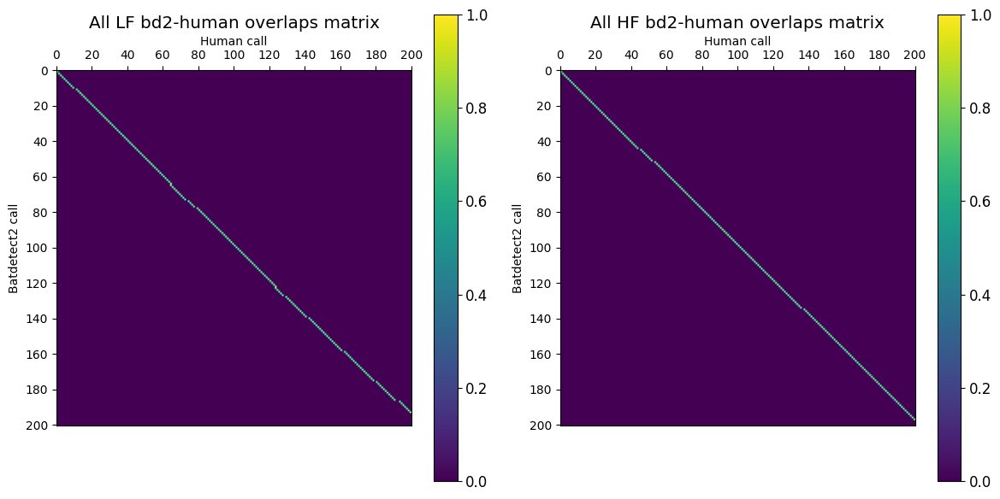

In [14]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,6))
plt.rcParams.update({'font.size':12})

samples=200
ax1.set_title('All LF bd2-human overlaps matrix')
im = ax1.imshow((lf_association_matrix[np.logical_or.reduce(lf_association_matrix, axis=1),:])[:samples,:samples])
ax1.set_xlabel('Human call')
ax1.xaxis.set_label_position('top')
ax1.set_ylabel('Batdetect2 call')
ax1.tick_params(top=True, labeltop=True, bottom=False, labelbottom=False)
fig.colorbar(im, orientation='vertical')
ax1.set_xticks(np.linspace(0, samples, 11)-0.75,
              np.linspace(0, samples, 11).astype(int))
ax1.set_yticks(np.linspace(0, samples, 11)-0.925,
              np.linspace(0, samples, 11).astype(int))



samples=200
ax2.set_title('All HF bd2-human overlaps matrix')
im = ax2.imshow((hf_association_matrix[np.logical_or.reduce(hf_association_matrix, axis=1),:])[:samples,:samples])
ax2.set_xlabel('Human call')
ax2.xaxis.set_label_position('top')
ax2.set_ylabel('Batdetect2 call')
ax2.tick_params(top=True, labeltop=True, bottom=False, labelbottom=False)
fig.colorbar(im, orientation='vertical')
ax2.set_xticks(np.linspace(0, samples, 11)-0.75,
              np.linspace(0, samples, 11).astype(int))
ax2.set_yticks(np.linspace(0, samples, 11)-0.925,
              np.linspace(0, samples, 11).astype(int))

plt.tight_layout()
plt.show()

In [15]:
hf_human_true_positives = lf_separated_performance_dfs['human_true_positives']
lf_bd2_false_negatives = lf_separated_performance_dfs['machine_false_negatives']
lf_bd2_true_positives = lf_separated_performance_dfs['machine_true_positives']
lf_bd2_false_positives = lf_separated_performance_dfs['machine_false_positives']
print(len(hf_human_true_positives), len(lf_bd2_false_negatives), len(lf_bd2_true_positives), len(lf_bd2_false_positives))

1086 52 1098 28685


In [16]:
hf_human_true_positives = hf_separated_performance_dfs['human_true_positives']
hf_bd2_false_negatives = hf_separated_performance_dfs['machine_false_negatives']
hf_bd2_true_positives = hf_separated_performance_dfs['machine_true_positives']
hf_bd2_false_positives = hf_separated_performance_dfs['machine_false_positives']
print(len(hf_human_true_positives), len(hf_bd2_false_negatives), len(hf_bd2_true_positives), len(hf_bd2_false_positives))

3227 41 3230 19706


In [17]:
num_trues_each_row = lf_association_matrix.sum(axis=1)
bd2_dets_with_overlap_human_dets = lf_bd2_file_all_dets.iloc[np.where(num_trues_each_row>1)[0]]
print(bd2_dets_with_overlap_human_dets.index.values)
lf_bd2_human_df_file[lf_association_matrix[3209,:]]

[]


,start_time,end_time,low_freq,high_freq,delta_time_s,snr_nist_quick_dB,Annotation,detection_confidence,input_file,freq_group,adityas_method_snr_dB,peak_frequency_time


In [18]:
num_trues_each_col = lf_association_matrix.sum(axis=0)
human_dets_with_overlap_bd2_dets = lf_bd2_human_df_file.iloc[np.where(num_trues_each_col>1)[0]]
print(human_dets_with_overlap_bd2_dets.index.values)
lf_bd2_file_all_dets[lf_association_matrix[:,812]]

[  64  123  371  521  546  694  696  763  812  864 1013 1015]


,freq_group,peak_frequency_time_SPECTROGRAM,peak_frequency_SPECTROGRAM,peak_frequency_WELCH,SNR,start_time,end_time,low_freq,high_freq,class,class_prob,det_prob,individual,event,sampling_rate,input_file
12106,LF,693.145633,26250.0,25920.0,4.563265,693.1405,693.1592,25468,28614,Nyctalus leisleri,0.314,0.392,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
12107,LF,693.158700,30750.0,31680.0,0.376598,693.1555,693.1633,28906,39772,Eptesicus serotinus,0.008,0.027,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...


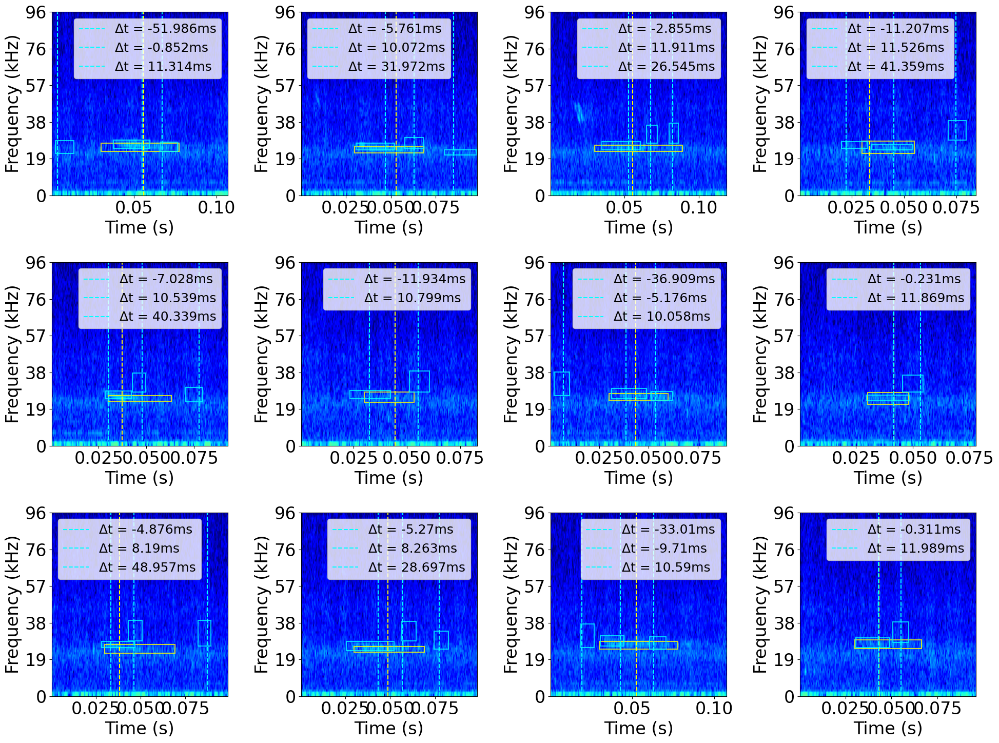

In [20]:
plt.figure(figsize=(20, 15))
plt.rcParams.update({'font.size': 24})
for i, sel_ind in enumerate((human_dets_with_overlap_bd2_dets.index).values):
    plt.subplot(3,4,i+1)
    selection_row = lf_bd2_human_df_file.iloc[sel_ind]
    file_name = f'{wav_filename}.WAV'
    file_path = Path(RAVENTXT_HUMAN_ANNOTATIONS_SAVE_DIR) / file_name
    audio_file = sf.SoundFile(file_path)
    fs = audio_file.samplerate

    start = selection_row['start_time']-0.03
    audio_file.seek(int(fs*(start)))
    duration = (selection_row['end_time']-selection_row['start_time'])+0.06
    audio_seg = audio_file.read(int(fs*duration))

    plt.specgram(audio_seg, NFFT=156, Fs=fs, cmap='jet', vmin=-120, vmax=0)

    ax = plt.gca()
    rect = patches.Rectangle(((selection_row['start_time'] - start), selection_row['low_freq']), 
                    (selection_row['end_time'] - selection_row['start_time']), (selection_row['high_freq'] - selection_row['low_freq']), 
                    linewidth=1.5, edgecolor='yellow', facecolor='none', alpha=0.8)
    ax.add_patch(rect)
    ax.axvline(x=selection_row['peak_frequency_time']-start, linestyle='dashed', color='yellow')

    plot_bd2dets = lf_bd2_file_all_dets[(lf_bd2_file_all_dets['start_time']>=start)&(lf_bd2_file_all_dets['end_time']<=(start+duration))]
    for i, row in plot_bd2dets.iterrows():
        rect = patches.Rectangle(((row['start_time'] - start), row['low_freq']), 
                        (row['end_time'] - row['start_time']), (row['high_freq'] - row['low_freq']), 
                        linewidth=1.5, edgecolor=FREQ_COLORS[selection_row['freq_group']], facecolor='none', alpha=0.8)
        ax.add_patch(rect)
        ax.axvline(x=row['peak_frequency_time_SPECTROGRAM']-start, linestyle='dashed', color='cyan', 
                label=f"Δt = {round(1000*(row['peak_frequency_time_SPECTROGRAM'] - selection_row['peak_frequency_time']), 3)}ms")

    plt.yticks(ticks=np.linspace(0, fs/2, 6), labels=np.linspace(0, fs/2000, 6).astype('int'))
    plt.legend(fontsize=18)
    plt.ylabel("Frequency (kHz)")
    plt.xlabel("Time (s)")

plt.tight_layout()
plt.show()

Above the detections within the `TP_CLASSIFICATION_THRESHOLD` are part of the true positives. They are within `TP_CLASSIFICATION_THRESHOLD` of the human annotation but NOT within `OVERLAP_TIME_THRESHOLD` of each other (which is why neither of them were dropped)

In [21]:
num_trues_each_row = hf_association_matrix.sum(axis=1)
bd2_dets_with_overlap_human_dets = hf_bd2_file_all_dets.iloc[np.where(num_trues_each_row>1)[0]]
print(bd2_dets_with_overlap_human_dets.index.values)
hf_bd2_human_df_file[hf_association_matrix[3209,:]]

[ 3209 17738 18087 18434 20676 21385 21570 22083 22093 22238 22241 22270]


,start_time,end_time,low_freq,high_freq,delta_time_s,snr_nist_quick_dB,Annotation,detection_confidence,input_file,freq_group,adityas_method_snr_dB,peak_frequency_time
531,246.849189,246.857813,45295.775,57775.076,0.0086,13.30,v,NaN,NaN,HF,6.877655,246.853898
532,246.858984,246.865694,37521.127,47323.944,0.0067,18.41,v,NaN,NaN,HF,5.973619,246.860941


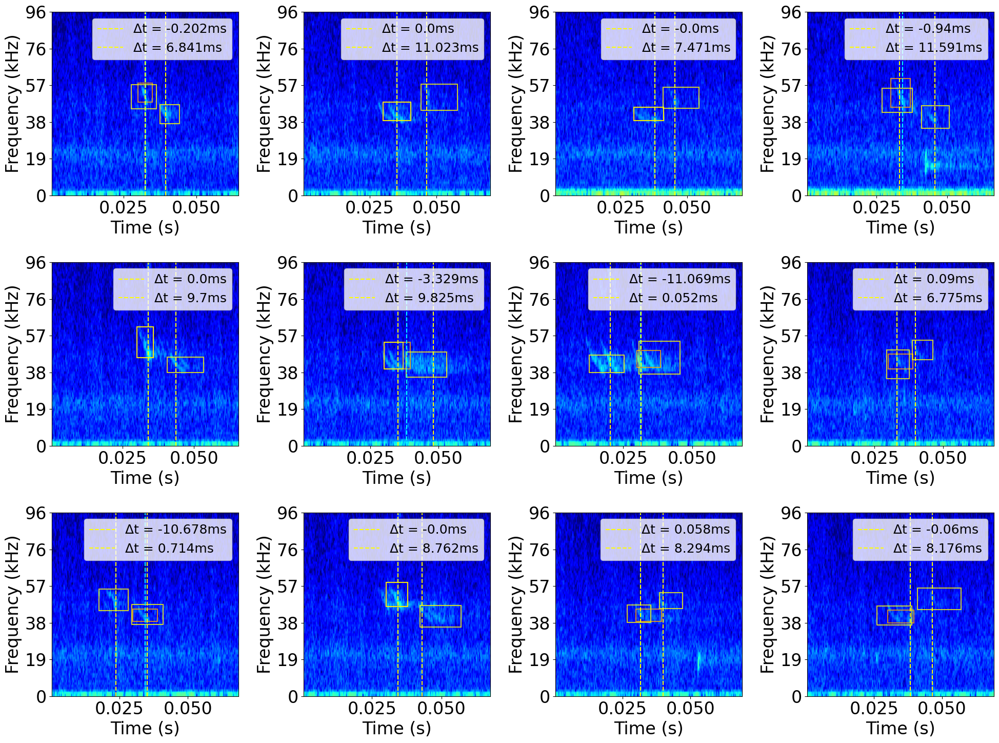

In [22]:
plt.figure(figsize=(20, 15))
plt.rcParams.update({'font.size': 24})
for i, sel_ind in enumerate((bd2_dets_with_overlap_human_dets.index).values):
    plt.subplot(3,4,i+1)
    selection_row = hf_bd2_file_all_dets.iloc[sel_ind]
    input_file = Path(selection_row['input_file'])
    file_name = input_file.name
    file_path = Path(RAVENTXT_HUMAN_ANNOTATIONS_SAVE_DIR) / file_name
    audio_file = sf.SoundFile(file_path)
    fs = audio_file.samplerate

    start = selection_row['start_time']-0.03
    audio_file.seek(int(fs*(start)))
    duration = (selection_row['end_time']-selection_row['start_time'])+0.06
    audio_seg = audio_file.read(int(fs*duration))

    plt.specgram(audio_seg, NFFT=156, Fs=fs, cmap='jet', vmin=-120, vmax=0)

    ax = plt.gca()
    rect = patches.Rectangle(((selection_row['start_time'] - start), selection_row['low_freq']), 
                    (selection_row['end_time'] - selection_row['start_time']), (selection_row['high_freq'] - selection_row['low_freq']), 
                    linewidth=1.5, edgecolor=FREQ_COLORS[selection_row['freq_group']], facecolor='none', alpha=0.8)
    ax.add_patch(rect)
    ax.axvline(x=selection_row['peak_frequency_time_SPECTROGRAM']-start, linestyle='dashed', color='cyan')

    plot_humandets = hf_bd2_human_df_file[(hf_bd2_human_df_file['start_time']>=start)&(hf_bd2_human_df_file['end_time']<=(start+duration))]
    for i, row in plot_humandets.iterrows():
        rect = patches.Rectangle(((row['start_time'] - start), row['low_freq']), 
                        (row['end_time'] - row['start_time']), (row['high_freq'] - row['low_freq']), 
                        linewidth=1.5, edgecolor='yellow', facecolor='none', alpha=0.8)
        ax.add_patch(rect)
        ax.axvline(x=row['peak_frequency_time']-start, linestyle='dashed', color='yellow', 
                label=f"Δt = {round(1000*(row['peak_frequency_time'] - selection_row['peak_frequency_time_SPECTROGRAM']), 3)}ms")

    plt.yticks(ticks=np.linspace(0, fs/2, 6), labels=np.linspace(0, fs/2000, 6).astype('int'))
    plt.legend(fontsize=18)
    plt.ylabel("Frequency (kHz)")
    plt.xlabel("Time (s)")

plt.tight_layout()
plt.show()

Above the human annotations within the `TP_CLASSIFICATION_THRESHOLD` are counted as overlapping with bd2 detections. This does NOT influence the bd2 true positives set because these are seen as only "human" true positives whereas we look at true values going rightward for bd2 true positives.

In [23]:
num_trues_each_col = hf_association_matrix.sum(axis=0)
human_dets_with_overlap_bd2_dets = hf_bd2_human_df_file.iloc[np.where(num_trues_each_col>1)[0]]
print(human_dets_with_overlap_bd2_dets.index.values)
hf_bd2_file_all_dets[hf_association_matrix[:,787]]

[ 332  414  552  787 1156 1526 1560 1956 2109 2173 2257 2270 2314 2894
 3090]


,freq_group,peak_frequency_time_SPECTROGRAM,peak_frequency_SPECTROGRAM,peak_frequency_WELCH,SNR,start_time,end_time,low_freq,high_freq,class,class_prob,det_prob,individual,event,sampling_rate,input_file
4534,HF,346.735633,72750.0,72000.0,1.040470,346.7165,346.7562,68437,81953,Rhinolophus ferrumequinum,0.025,0.025,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
4535,HF,346.720800,41250.0,41280.0,3.711329,346.7175,346.7252,38359,48411,Pipistrellus nathusii,0.248,0.347,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...


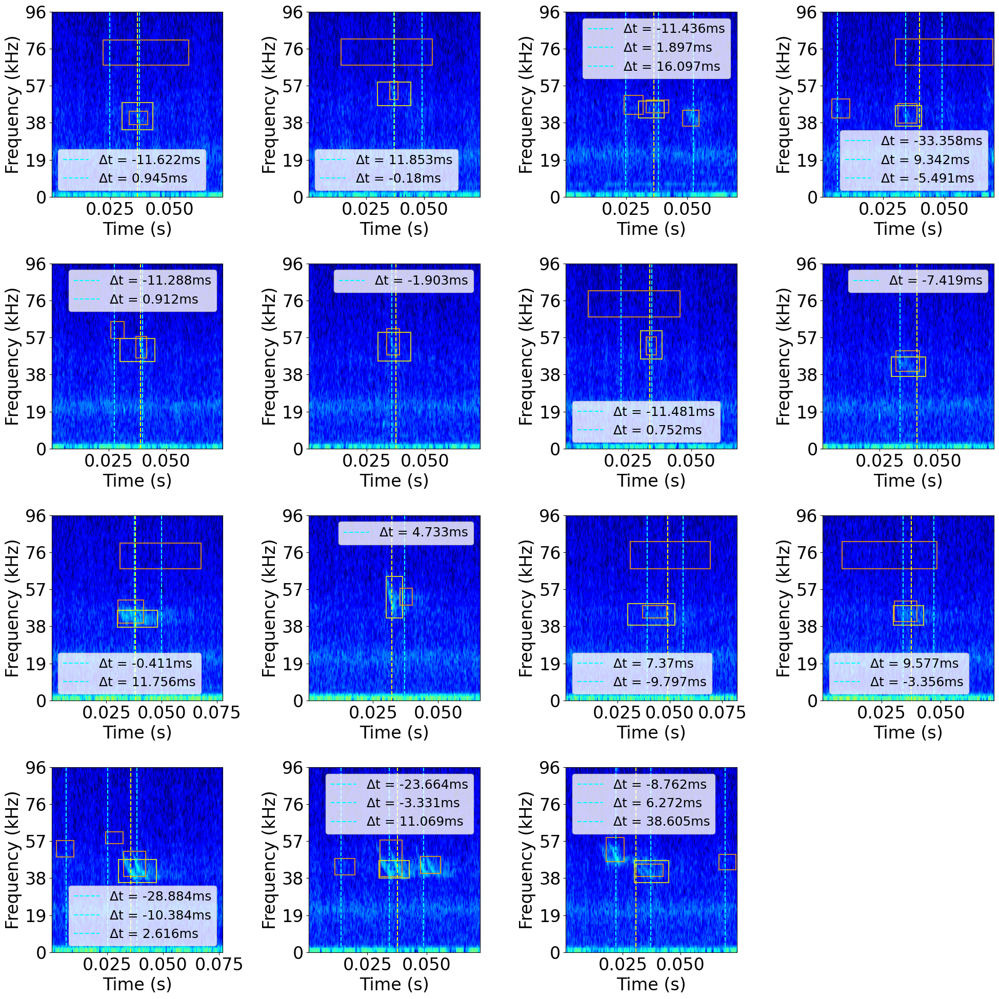

In [24]:
plt.figure(figsize=(20, 20))
plt.rcParams.update({'font.size': 24})
for i, sel_ind in enumerate((human_dets_with_overlap_bd2_dets.index).values):
    plt.subplot(4,4,i+1)
    selection_row = hf_bd2_human_df_file.iloc[sel_ind]
    file_name = f'{wav_filename}.WAV'
    file_path = Path(RAVENTXT_HUMAN_ANNOTATIONS_SAVE_DIR) / file_name
    audio_file = sf.SoundFile(file_path)
    fs = audio_file.samplerate

    start = selection_row['start_time']-0.03
    audio_file.seek(int(fs*(start)))
    duration = (selection_row['end_time']-selection_row['start_time'])+0.06
    audio_seg = audio_file.read(int(fs*duration))

    plt.specgram(audio_seg, NFFT=156, Fs=fs, cmap='jet', vmin=-120, vmax=0)

    ax = plt.gca()
    rect = patches.Rectangle(((selection_row['start_time'] - start), selection_row['low_freq']), 
                    (selection_row['end_time'] - selection_row['start_time']), (selection_row['high_freq'] - selection_row['low_freq']), 
                    linewidth=1.5, edgecolor='yellow', facecolor='none', alpha=0.8)
    ax.add_patch(rect)
    ax.axvline(x=selection_row['peak_frequency_time']-start, linestyle='dashed', color='yellow')

    plot_bd2dets = hf_bd2_file_all_dets[(hf_bd2_file_all_dets['start_time']>=start)&(hf_bd2_file_all_dets['end_time']<=(start+duration))]
    for i, row in plot_bd2dets.iterrows():
        rect = patches.Rectangle(((row['start_time'] - start), row['low_freq']), 
                        (row['end_time'] - row['start_time']), (row['high_freq'] - row['low_freq']), 
                        linewidth=1.5, edgecolor=FREQ_COLORS[selection_row['freq_group']], facecolor='none', alpha=0.8)
        ax.add_patch(rect)
        ax.axvline(x=row['peak_frequency_time_SPECTROGRAM']-start, linestyle='dashed', color='cyan', 
                label=f"Δt = {round(1000*(row['peak_frequency_time_SPECTROGRAM'] - selection_row['peak_frequency_time']), 3)}ms")

    plt.yticks(ticks=np.linspace(0, fs/2, 6), labels=np.linspace(0, fs/2000, 6).astype('int'))
    plt.legend(fontsize=18)
    plt.ylabel("Frequency (kHz)")
    plt.xlabel("Time (s)")

plt.tight_layout()
plt.show()

Above the detections within the `TP_CLASSIFICATION_THRESHOLD` are part of the true positives. They are within `TP_CLASSIFICATION_THRESHOLD` of the human annotation but NOT within `OVERLAP_TIME_THRESHOLD` of each other (which is why neither of them were dropped)

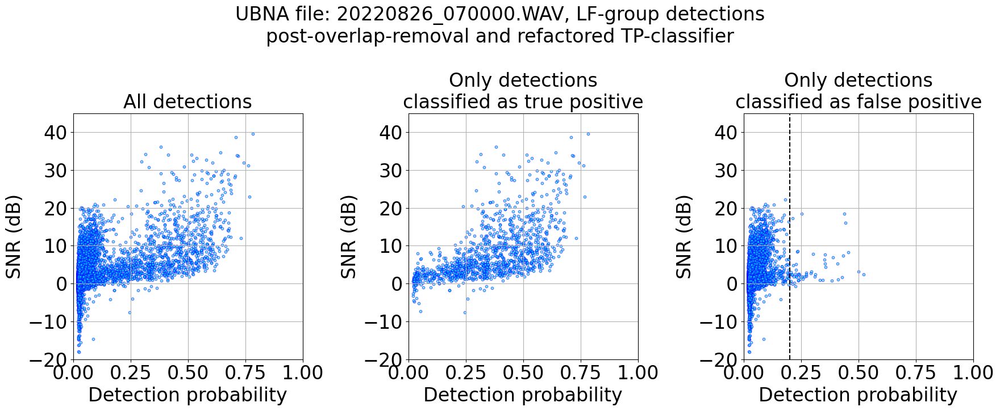

In [25]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18,7.5))
plt.rcParams.update({'font.size':20})

fig.suptitle(f'UBNA file: {wav_filename}.WAV, LF-group detections\npost-overlap-removal and refactored TP-classifier')

ax = ax1
ax.set_title(f'All detections')
ax.scatter(lf_bd2_file_all_dets['det_prob'].values, lf_bd2_file_all_dets['SNR'].values,
            alpha=0.5, s=10, facecolor='cyan', edgecolor='blue')
ax.grid(which='both')
ax.set_xlabel('Detection probability')
ax.set_ylabel('SNR (dB)')
ax.set_xlim(0, 1.0)
ax.set_ylim(-20, 45.0)

ax = ax2
ax.set_title(f'Only detections\nclassified as true positive')
ax.scatter(lf_bd2_true_positives['det_prob'].values, lf_bd2_true_positives['SNR'].values,
            alpha=0.5, s=10, facecolor='cyan', edgecolor='blue')
ax.grid(which='both')
ax.set_xlabel('Detection probability')
ax.set_ylabel('SNR (dB)')
ax.set_xlim(0, 1.0)
ax.set_ylim(-20, 45.0)

ax = ax3
ax.set_title(f'Only detections\nclassified as false positive')
ax.scatter(lf_bd2_false_positives['det_prob'].values, lf_bd2_false_positives['SNR'].values,
            alpha=0.5, s=10, facecolor='cyan', edgecolor='blue')
ax.axvline(x=0.2, linestyle='dashed', color='k')
ax.grid(which='both')
ax.set_xlabel('Detection probability')
ax.set_ylabel('SNR (dB)')
ax.set_xlim(0, 1.0)
ax.set_ylim(-20, 45.0)


fig.tight_layout()
plt.show()

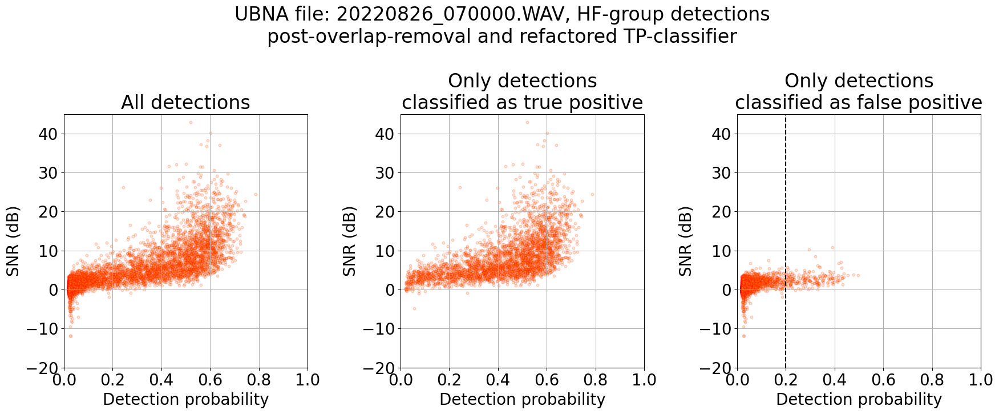

In [26]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18,7.5))
plt.rcParams.update({'font.size':20})

fig.suptitle(f'UBNA file: {wav_filename}.WAV, HF-group detections\npost-overlap-removal and refactored TP-classifier')

ax = ax1
ax.set_title(f'All detections')
ax.scatter(hf_bd2_file_all_dets['det_prob'].values, hf_bd2_file_all_dets['SNR'].values,
            alpha=0.2, s=10, facecolor='orange', edgecolor='red')
ax.grid(which='both')
ax.set_xlabel('Detection probability')
ax.set_ylabel('SNR (dB)')
ax.set_xlim(0, 1.0)
ax.set_ylim(-20, 45.0)

ax = ax2
ax.set_title(f'Only detections\nclassified as true positive')
ax.scatter(hf_bd2_true_positives['det_prob'].values, hf_bd2_true_positives['SNR'].values,
            alpha=0.2, s=10, facecolor='orange', edgecolor='red')
ax.grid(which='both')
ax.set_xlabel('Detection probability')
ax.set_ylabel('SNR (dB)')
ax.set_xlim(0, 1.0)
ax.set_ylim(-20, 45.0)

ax = ax3
ax.set_title(f'Only detections\nclassified as false positive')
ax.scatter(hf_bd2_false_positives['det_prob'].values, hf_bd2_false_positives['SNR'].values,
            alpha=0.2, s=10, facecolor='orange', edgecolor='red')
ax.axvline(x=0.2, linestyle='dashed', color='k')
ax.grid(which='both')
ax.set_xlabel('Detection probability')
ax.set_ylabel('SNR (dB)')
ax.set_xlim(0, 1.0)
ax.set_ylim(-20, 45.0)


fig.tight_layout()
plt.show()

In [27]:
suspect_lf_bd2_false_positives = lf_bd2_false_positives[lf_bd2_false_positives['det_prob']>0.2]
suspect_lf_bd2_false_positives

,freq_group,peak_frequency_time_SPECTROGRAM,peak_frequency_SPECTROGRAM,peak_frequency_WELCH,SNR,start_time,end_time,low_freq,high_freq,class,class_prob,det_prob,individual,event,sampling_rate,input_file
2603,LF,154.512433,26250.0,25920.0,3.234682,154.5045,154.5169,24609,30094,Nyctalus leisleri,0.257,0.500,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
3037,LF,177.756400,25500.0,24960.0,7.650963,177.7495,177.7676,24609,27711,Nyctalus leisleri,0.241,0.355,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
3111,LF,181.188300,24750.0,24960.0,2.940043,181.1825,181.1947,23750,28434,Eptesicus serotinus,0.124,0.272,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
3115,LF,181.867700,26250.0,26880.0,2.736372,181.8605,181.8748,26328,30167,Nyctalus leisleri,0.168,0.292,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
3342,LF,197.014967,25500.0,24960.0,5.292185,197.0105,197.0287,24609,27928,Nyctalus leisleri,0.327,0.409,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
3397,LF,199.804833,25500.0,24960.0,4.297234,199.7965,199.8155,24609,28827,Nyctalus leisleri,0.244,0.358,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
3637,LF,212.288700,24750.0,24960.0,-0.672904,212.2815,212.2958,23750,28798,Nyctalus leisleri,0.085,0.225,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
4881,LF,291.941233,24000.0,24960.0,0.948543,291.9335,291.9496,23750,27496,Nyctalus leisleri,0.222,0.333,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
5063,LF,300.592400,26250.0,24960.0,2.031932,300.5835,300.5996,25468,30336,Nyctalus leisleri,0.153,0.272,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
5336,LF,314.678267,27000.0,26880.0,5.152753,314.6635,314.6819,26328,30071,Nyctalus leisleri,0.153,0.227,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...


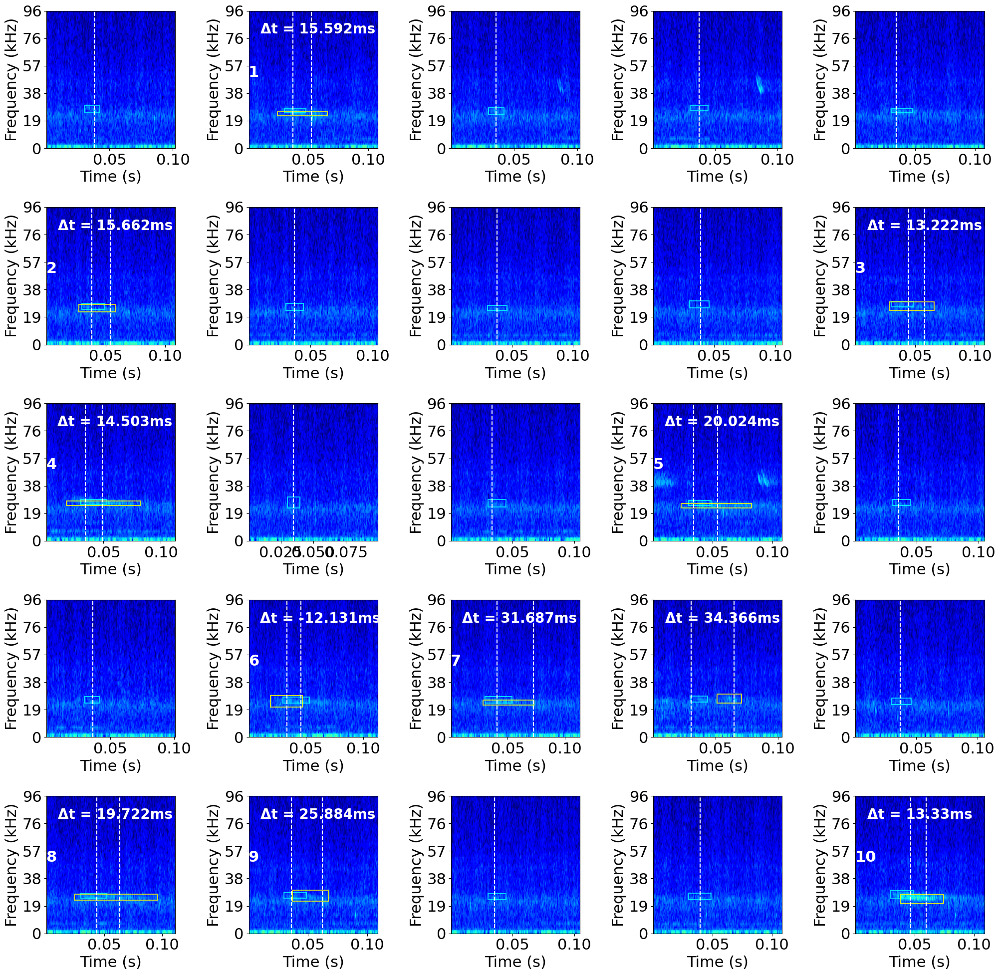

In [28]:
selections = suspect_lf_bd2_false_positives[:25].reset_index(drop=True).copy()
plt.figure(figsize=(4.1*int(np.ceil(len(selections)**0.5)), 4*int(np.ceil(len(selections)**0.5))))
plt.rcParams.update({'font.size': 22})
overlap_count = 0
for ind, selection_row in selections.iterrows():
    plt.subplot(int(np.ceil(len(selections)**0.5)), int(np.ceil(len(selections)**0.5)), ind+1)
    input_file = Path(selection_row['input_file'])
    file_name = input_file.name
    file_path = Path(RAVENTXT_HUMAN_ANNOTATIONS_SAVE_DIR) / file_name
    audio_file = sf.SoundFile(file_path)
    fs = audio_file.samplerate

    raventxt_human_filename = f'{input_file.stem}_manually_verified_by_AK_with_groups'

    start = selection_row['start_time']-0.03
    audio_file.seek(int(fs*(start)))
    duration = (selection_row['end_time']-selection_row['start_time'])+0.09
    audio_seg = audio_file.read(int(fs*duration))

    plt.specgram(audio_seg, NFFT=156, Fs=fs, cmap='jet', vmin=-120, vmax=0)

    ax = plt.gca()
    rect = patches.Rectangle(((selection_row['start_time'] - start), selection_row['low_freq']), 
                    (selection_row['end_time'] - selection_row['start_time']), (selection_row['high_freq'] - selection_row['low_freq']), 
                    linewidth=1.5, edgecolor=FREQ_COLORS[selection_row['freq_group']], facecolor='none', alpha=0.8)
    ax.add_patch(rect)
    ax.axvline(x=selection_row['peak_frequency_time_SPECTROGRAM']-start, linestyle='dashed', color='w')

    plot_humandets = lf_bd2_human_df_file[(lf_bd2_human_df_file['start_time']>=start)&(lf_bd2_human_df_file['end_time']<=(start+duration))]
    for i, row in plot_humandets.iterrows():
        rect = patches.Rectangle(((row['start_time'] - start), row['low_freq']), 
                        (row['end_time'] - row['start_time']), (row['high_freq'] - row['low_freq']), 
                        linewidth=1.5, edgecolor='yellow', facecolor='none', alpha=0.8)
        ax.add_patch(rect)
        ax.axvline(x=row['peak_frequency_time']-start, linestyle='dashed', color='w')
    shortest_t_delay_in_window = np.abs(1000*(plot_humandets['peak_frequency_time'] - selection_row['peak_frequency_time_SPECTROGRAM'])).min()
    shortest_t_distance_in_window = (1000*(plot_humandets['peak_frequency_time'] - selection_row['peak_frequency_time_SPECTROGRAM'])).min()
    if ~(np.isnan(shortest_t_delay_in_window)):
        plt.text(x=0.01, y=80e3, s=f"Δt = {round(shortest_t_distance_in_window, 3)}ms",
                fontsize=20, color='white', fontweight='bold', zorder=2)
    if (np.abs(shortest_t_distance_in_window)<32):
        overlap_count+=1
        plt.text(x=0, y=50e3, s=f'{overlap_count}', color='w', fontweight='bold')
    plt.yticks(ticks=np.linspace(0, fs/2, 6), labels=np.linspace(0, fs/2000, 6).astype('int'))
    plt.ylabel("Frequency (kHz)")
    plt.xlabel("Time (s)")

plt.tight_layout()
plt.show()

In [29]:
selections = suspect_lf_bd2_false_positives.reset_index(drop=True).copy()
overlap_count = 0
overlap_determination_thresh = 32
for ind, selection_row in selections.iterrows():
    raventxt_human_filename = f'{input_file.stem}_manually_verified_by_AK_with_groups'

    start = selection_row['start_time']-0.03
    duration = (selection_row['end_time']-selection_row['start_time'])+0.09
    plot_humandets = lf_bd2_human_df_file[(lf_bd2_human_df_file['start_time']>=start)&(lf_bd2_human_df_file['end_time']<=(start+duration))]
    shortest_t_delay_in_window = np.abs(1000*(plot_humandets['peak_frequency_time'] - selection_row['peak_frequency_time_SPECTROGRAM'])).min()
    shortest_t_distance_in_window = (1000*(plot_humandets['peak_frequency_time'] - selection_row['peak_frequency_time_SPECTROGRAM'])).min()
    if (np.abs(shortest_t_distance_in_window)<overlap_determination_thresh):
        overlap_count+=1
print(f'{overlap_count}/{len(selections)} ({round(overlap_count/len(selections), 3)}) HF false positives were actually true positives with peak times distances > {int(1000*TP_CLASSIFICATION_THRESHOLD)}ms but < {overlap_determination_thresh}ms')

18/55 (0.327) HF false positives were actually true positives with peak times distances > 12ms but < 32ms


In [30]:
suspect_hf_bd2_false_positives = hf_bd2_false_positives[hf_bd2_false_positives['det_prob']>0.2]
suspect_hf_bd2_false_positives

,freq_group,peak_frequency_time_SPECTROGRAM,peak_frequency_SPECTROGRAM,peak_frequency_WELCH,SNR,start_time,end_time,low_freq,high_freq,class,class_prob,det_prob,individual,event,sampling_rate,input_file
408,HF,33.286533,48750.0,48960.0,5.603281,33.2835,33.2903,46953,53159,Pipistrellus pipistrellus,0.403,0.429,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
415,HF,33.719000,49500.0,48960.0,1.833284,33.7155,33.7230,46093,53579,Pipistrellus pipistrellus,0.204,0.216,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
471,HF,39.927667,48000.0,48960.0,10.908490,39.9245,39.9300,46953,55476,Pipistrellus pipistrellus,0.302,0.392,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
477,HF,40.413567,52500.0,49920.0,3.581238,40.4105,40.4161,47812,58828,Pipistrellus pipistrellus,0.345,0.364,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
502,HF,41.537300,45750.0,48960.0,3.943825,41.5325,41.5387,43515,54026,Pipistrellus pipistrellus,0.147,0.201,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22605,HF,1767.702900,39750.0,39360.0,1.251738,1767.6985,1767.7086,38359,42414,Pipistrellus nathusii,0.293,0.351,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
22649,HF,1769.614233,41250.0,40320.0,0.081270,1769.6105,1769.6201,39218,43798,Pipistrellus nathusii,0.294,0.331,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
22714,HF,1774.076933,40500.0,40320.0,1.316114,1774.0725,1774.0814,40078,45892,Pipistrellus nathusii,0.381,0.434,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
22785,HF,1778.224233,42000.0,43200.0,1.928925,1778.2205,1778.2301,39218,43998,Pipistrellus nathusii,0.220,0.273,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...


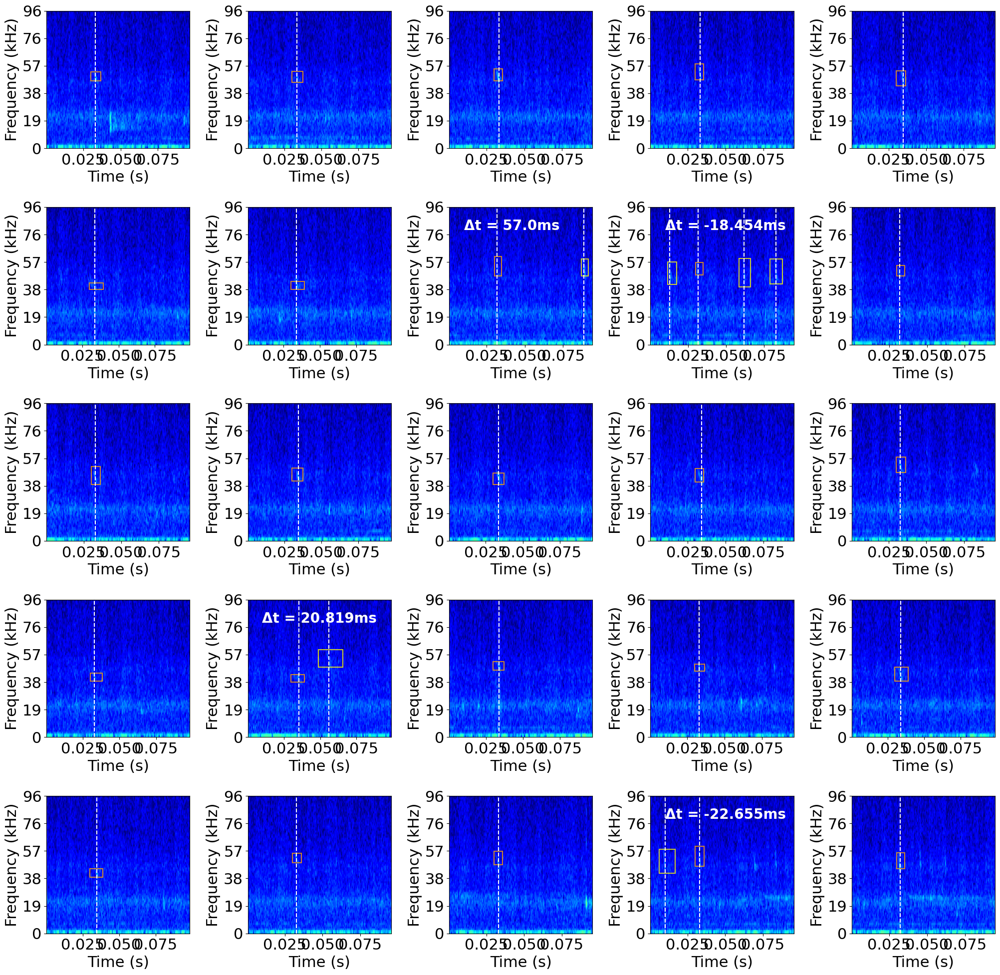

In [31]:
selections = suspect_hf_bd2_false_positives[:25].reset_index(drop=True).copy()
plt.figure(figsize=(4.1*int(np.ceil(len(selections)**0.5)), 4*int(np.ceil(len(selections)**0.5))))
plt.rcParams.update({'font.size': 22})
overlap_count = 0
for ind, selection_row in selections.iterrows():
    plt.subplot(int(np.ceil(len(selections)**0.5)), int(np.ceil(len(selections)**0.5)), ind+1)
    input_file = Path(selection_row['input_file'])
    file_name = input_file.name
    file_path = Path(RAVENTXT_HUMAN_ANNOTATIONS_SAVE_DIR) / file_name
    audio_file = sf.SoundFile(file_path)
    fs = audio_file.samplerate

    file_selections = selections[selections['input_file']==str(input_file)]
    raventxt_human_filename = f'{input_file.stem}_manually_verified_by_AK_with_groups'

    start = selection_row['start_time']-0.03
    audio_file.seek(int(fs*(start)))
    duration = (selection_row['end_time']-selection_row['start_time'])+0.09
    audio_seg = audio_file.read(int(fs*duration))

    plt.specgram(audio_seg, NFFT=156, Fs=fs, cmap='jet', vmin=-120, vmax=0)

    ax = plt.gca()
    rect = patches.Rectangle(((selection_row['start_time'] - start), selection_row['low_freq']), 
                    (selection_row['end_time'] - selection_row['start_time']), (selection_row['high_freq'] - selection_row['low_freq']), 
                    linewidth=1.5, edgecolor=FREQ_COLORS[selection_row['freq_group']], facecolor='none', alpha=0.8)
    ax.add_patch(rect)
    ax.axvline(x=selection_row['peak_frequency_time_SPECTROGRAM']-start, linestyle='dashed', color='w')

    plot_humandets = hf_bd2_human_df_file[(hf_bd2_human_df_file['start_time']>=start)&(hf_bd2_human_df_file['end_time']<=(start+duration))]
    for i, row in plot_humandets.iterrows():
        rect = patches.Rectangle(((row['start_time'] - start), row['low_freq']), 
                        (row['end_time'] - row['start_time']), (row['high_freq'] - row['low_freq']), 
                        linewidth=1.5, edgecolor='yellow', facecolor='none', alpha=0.8)
        ax.add_patch(rect)
        ax.axvline(x=row['peak_frequency_time']-start, linestyle='dashed', color='w')
    shortest_t_delay_in_window = np.abs(1000*(plot_humandets['peak_frequency_time'] - selection_row['peak_frequency_time_SPECTROGRAM'])).min()
    shortest_t_distance_in_window = (1000*(plot_humandets['peak_frequency_time'] - selection_row['peak_frequency_time_SPECTROGRAM'])).min()
    if ~(np.isnan(shortest_t_delay_in_window)):
        plt.text(x=0.01, y=80e3, s=f"Δt = {round(shortest_t_distance_in_window, 3)}ms",
                fontsize=20, color='white', fontweight='bold', zorder=2)
    if (np.abs(shortest_t_distance_in_window)<10):
        overlap_count+=1
        plt.text(x=0, y=50e3, s=f'{overlap_count}', color='w', fontweight='bold')
    plt.yticks(ticks=np.linspace(0, fs/2, 6), labels=np.linspace(0, fs/2000, 6).astype('int'))
    plt.ylabel("Frequency (kHz)")
    plt.xlabel("Time (s)")

plt.tight_layout()
plt.show()

In [32]:
selections = suspect_hf_bd2_false_positives.reset_index(drop=True).copy()
overlap_count = 0
overlap_determination_thresh = 20
for ind, selection_row in selections.iterrows():
    raventxt_human_filename = f'{input_file.stem}_manually_verified_by_AK_with_groups'

    start = selection_row['start_time']-0.03
    duration = (selection_row['end_time']-selection_row['start_time'])+0.09
    plot_humandets = hf_bd2_human_df_file[(hf_bd2_human_df_file['start_time']>=start)&(hf_bd2_human_df_file['end_time']<=(start+duration))]
    shortest_t_delay_in_window = np.abs(1000*(plot_humandets['peak_frequency_time'] - selection_row['peak_frequency_time_SPECTROGRAM'])).min()
    shortest_t_distance_in_window = (1000*(plot_humandets['peak_frequency_time'] - selection_row['peak_frequency_time_SPECTROGRAM'])).min()
    if (np.abs(shortest_t_distance_in_window)<overlap_determination_thresh):
        overlap_count+=1
print(f'{overlap_count}/{len(selections)} ({round(overlap_count/len(selections), 3)}) HF false positives were actually true positives with peak times distances > {int(1000*TP_CLASSIFICATION_THRESHOLD)}ms but < {overlap_determination_thresh}ms')

3/195 (0.015) HF false positives were actually true positives with peak times distances > 12ms but < 20ms
